# CNN 遥感图像分类项目 -  多分类

## 数据说明
This is a 21 class land use image dataset meant for research purposes. 
There are 100 images for each of the following classes:
+ agricultural
+ airplane
+ baseballdiamond
+ beach
+ buildings
+ chaparral
+ denseresidential
+ forest
+ freeway
+ golfcourse
+ harbor
+ intersection
+ mediumresidential
+ mobilehomepark
+ overpass
+ parkinglot
+ river
+ runway
+ sparseresidential
+ storagetanks
+ tenniscourt

Each image measures 256x256 pixels.

The images were manually extracted from large images from the USGS National Map Urban Area Imagery collection for various urban areas around the country. The pixel resolution of this public domain imagery is 1 foot.

Download site: http://weegee.vision.ucmerced.edu/datasets/landuse.html

# 1. 读取原始数据和文件

## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

from skimage.transform import resize
import cv2

from PIL import Image
import os
from shutil import copyfile

In [2]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

from tensorflow import keras
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.layers import ZeroPadding2D, Dropout, Flatten, add, Reshape
from tensorflow.keras.layers import Activation, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.utils import plot_model,to_categorical
from tensorflow.keras import backend as K
from tensorflow.keras import initializers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

In [3]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import decode_predictions
from tensorflow.keras.applications.vgg16 import VGG16

## Load image data

Select 8 categories only for the project to reduce the computation time

In [4]:
category_names = [
    'agricultural',
    'forest',
    'mobilehomepark',
    'overpass',
    'parkinglot',
    'river',
    'runway',
    'sparseresidential'
]

In [5]:
Image_directory = 'data/UCMerced_LandUse/Images'

In [6]:
num_images = 100  # per category
nb_classes = len(category_names)
patch_size = 256  # width and height in pixel
channels = 3

In [7]:
nb_classes

8

In [8]:
# Load the original dataset
images_orig = []
labels_num = []
for i in range(len(category_names)):    
    # load all images per class
    for j in range(num_images):        
        img_path = os.path.join(Image_directory, category_names[i], category_names[i]+'{:02d}.tif'.format(j))
        
        #new_image = plt.imread(img_path) 
        #resized_image = resize(new_image, (patch_size/4, patch_size/4, channels))
        img = Image.open(img_path)
        
        resized_img = img.resize((224, 224), Image.ANTIALIAS)

        arr = np.asarray(resized_img)
        
        images_orig.append(arr)
        labels_num.append([i])

Image Normalization  

In [9]:
images_orig = np.array(images_orig)

print('Image Original Data Type: %s' % images_orig[0].dtype)
print('Original: Min: %.3f, Max: %.3f' % (images_orig.min(), images_orig.max()))
# convert from integers to floats
images_orig = images_orig.astype('float32')
# normalize to the range 0-1
images_orig /= 255.0
# confirm the normalization
print('\nImage Resized Data Type: %s' % images_orig[0].dtype)
print('Resized: Min: %.3f, Max: %.3f' % (images_orig.min(), images_orig.max()))

labels_num = np.array(labels_num)

# Save the numpy datasets
np.save('data/UCMerced_images_orig_MultiClass224.npy', images_orig)
np.save('data/UCMerced_labels_num_MultiClass224.npy', labels_num)      

Image Original Data Type: uint8
Original: Min: 0.000, Max: 255.000

Image Resized Data Type: float32
Resized: Min: 0.000, Max: 1.000


In [10]:
# Load the numpy datasets
images_orig = np.load('data/UCMerced_images_orig_MultiClass224.npy')
labels_num = np.load('data/UCMerced_labels_num_MultiClass224.npy')

# Convert labels to categorical 'one hot encoded vector' --> required format for softmax cross-entropy loss.
# Create an array of zeros with length nb_classes and put a 1 at the index of the true label.
labels = to_categorical(labels_num, nb_classes)

print('Orginal Labels: \n')
for i in range(1,(nb_classes)*100+1, 100):
    print(labels_num[i])

print('One-hot encoded Labels: \n')
for i in range(1,(nb_classes)*100+1, 100):
    print(labels[i])

print('\nImages shape: {}'.format(images_orig.shape))
print('\nLabel shape: {}'.format(labels.shape))

Orginal Labels: 

[0]
[1]
[2]
[3]
[4]
[5]
[6]
[7]
One-hot encoded Labels: 

[1. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 0. 0. 0. 0. 0. 0.]
[0. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 1. 0. 0. 0. 0.]
[0. 0. 0. 0. 1. 0. 0. 0.]
[0. 0. 0. 0. 0. 1. 0. 0.]
[0. 0. 0. 0. 0. 0. 1. 0.]
[0. 0. 0. 0. 0. 0. 0. 1.]

Images shape: (800, 224, 224, 3)

Label shape: (800, 8)


In [11]:
nb_images = images_orig.shape[0]
nb_images

800

In [12]:
X_train, X_test, y_train, y_test = train_test_split(images_orig, labels, 
                                                    test_size=0.2, 
                                                    stratify = labels, 
                                                    random_state=2021)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, 
                                                  test_size=0.25, 
                                                  stratify = y_train,
                                                  random_state=2021) 

# 0.25 x 0.8 = 0.2

In [13]:
model = VGG16(include_top=False, input_shape=(224, 224, 3))
# add new classifier layers
#for layer in model.layers:
#    layer.trainable = False
flat1 = Flatten()(model.layers[-1].output)

class1 = Dense(1024, activation='relu')(flat1)
output = Dense(8, activation='softmax')(class1)
# define new model
model = Model(inputs=model.inputs, outputs=output)
# summarize
model.summary()
# ...

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)      

In [14]:
for l in model.layers:
    print(l.name, l.trainable)

input_1 True
block1_conv1 True
block1_conv2 True
block1_pool True
block2_conv1 True
block2_conv2 True
block2_pool True
block3_conv1 True
block3_conv2 True
block3_conv3 True
block3_pool True
block4_conv1 True
block4_conv2 True
block4_conv3 True
block4_pool True
block5_conv1 True
block5_conv2 True
block5_conv3 True
block5_pool True
flatten True
dense True
dense_1 True


In [15]:
# Set hyper parameters
epochs = 20
base_learning_rate=0.0001
batch_size = 32
# Calculate the number of batches per epoch. 
# One epoch is defined as an update pass through the full training data. 
# One iteration is defined as an update through one mini-batch.
batches_per_epoch = y_train.shape[0]//batch_size
# the number of batches to see the full validation data:
validation_steps = y_val.shape[0]//batch_size
print('number of images per batch: {}'.format(batch_size))
print('batches per epoch: {}'.format(batches_per_epoch))
print('validation steps: {}'.format(validation_steps))
# Data Generator provided by keras to load the training data in batches
image_gen = ImageDataGenerator(
#    zoom_range = 0.1,
#    width_shift_range=5,   # pixel
#    height_shift_range=5,  # pixel
#    horizontal_flip=True,
#    vertical_flip=True,
#    rotation_range=20
)

# At Test/Validation time without data augmentation
image_gen_test = ImageDataGenerator()
train_gen = image_gen.flow(np.array(X_train),
                           y_train,
                           batch_size = batch_size,
                           shuffle = True)
val_gen = image_gen_test.flow(np.array(X_val),
                              y_val,
                              batch_size = batch_size,
                              shuffle = True)


number of images per batch: 32
batches per epoch: 15
validation steps: 5


In [16]:
# Define an optimizer
opt = Adam(lr=base_learning_rate)

model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])    

In [17]:
checkpoint_best_model = 'model/MultiClass_TL_001ALL.hdf5'
mc = ModelCheckpoint(checkpoint_best_model, monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)        

In [18]:
# Fit the model parameters
print('training...')

history = model.fit(
                x=train_gen,
                steps_per_epoch=batches_per_epoch, 
                epochs=epochs, 
                validation_data=val_gen,
                validation_steps=validation_steps,
                verbose = 2,
                callbacks=mc
                )

print('done')

training...
Epoch 1/20

Epoch 00001: val_accuracy improved from -inf to 0.93750, saving model to model\MultiClass_TL_001ALL.hdf5
15/15 - 287s - loss: 0.9489 - accuracy: 0.6854 - val_loss: 0.2158 - val_accuracy: 0.9375
Epoch 2/20

Epoch 00002: val_accuracy did not improve from 0.93750
15/15 - 333s - loss: 0.1814 - accuracy: 0.9417 - val_loss: 0.4259 - val_accuracy: 0.9250
Epoch 3/20

Epoch 00003: val_accuracy did not improve from 0.93750
15/15 - 328s - loss: 0.2734 - accuracy: 0.9229 - val_loss: 0.2538 - val_accuracy: 0.9250
Epoch 4/20

Epoch 00004: val_accuracy improved from 0.93750 to 0.98125, saving model to model\MultiClass_TL_001ALL.hdf5
15/15 - 334s - loss: 0.1244 - accuracy: 0.9604 - val_loss: 0.1211 - val_accuracy: 0.9812
Epoch 5/20

Epoch 00005: val_accuracy did not improve from 0.98125
15/15 - 332s - loss: 0.0317 - accuracy: 0.9917 - val_loss: 0.1742 - val_accuracy: 0.9500
Epoch 6/20

Epoch 00006: val_accuracy did not improve from 0.98125
15/15 - 330s - loss: 0.0186 - accuracy

In [19]:
def history_plot(model_id, history):
	plt.figure(figsize=(8,10)) 
	# plot loss
	plt.subplot(2, 1, 1)
	plt.title('Cross Entropy Loss - ' + model_id, fontsize = 12)
	plt.plot(history.history['loss'], color='blue', label='train')
	plt.plot(history.history['val_loss'], color='orange', label='val')
	plt.xlabel("Epochs",fontsize = 12)
	plt.ylabel("Loss", fontsize = 12)
	plt.legend(loc='upper right')

	# plot accuracy
	plt.subplot(2, 1, 2)
	plt.title('Classification Accuracy ' + model_id, fontsize = 10)
	plt.plot(history.history['accuracy'], color='blue', label='train')
	plt.plot(history.history['val_accuracy'], color='orange', label='val')
	plt.xlabel("Epochs", fontsize = 12)
	plt.ylabel("Accuracy", fontsize = 12)
	plt.legend(loc='lower right')

	plt.show()

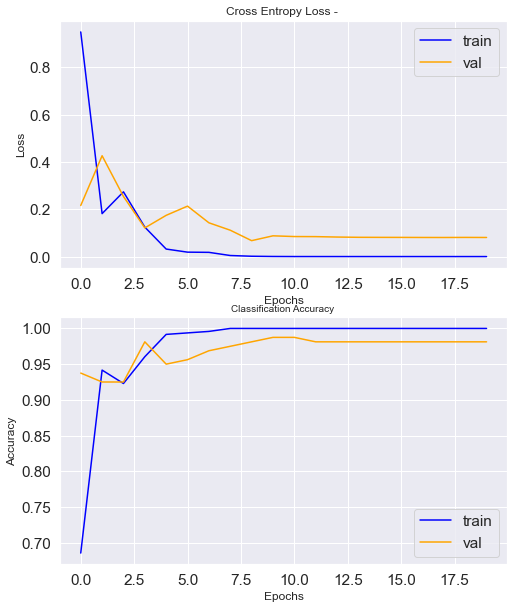

In [28]:
 history_plot("", history)

In [20]:

print('predicting...')
predictions = model.predict(x=X_test, batch_size=batch_size)

# convert predictions    
print('num. predictions: ', len(predictions))

predicting...
num. predictions:  160


In [21]:
y_pred = to_categorical(np.argmax(predictions, axis=1), nb_classes)

In [22]:
# classification report
report_string = classification_report(y_test, y_pred, target_names=category_names)
print(report_string)

                   precision    recall  f1-score   support

     agricultural       1.00      1.00      1.00        20
           forest       1.00      1.00      1.00        20
   mobilehomepark       1.00      1.00      1.00        20
         overpass       1.00      1.00      1.00        20
       parkinglot       1.00      1.00      1.00        20
            river       1.00      1.00      1.00        20
           runway       1.00      1.00      1.00        20
sparseresidential       1.00      1.00      1.00        20

        micro avg       1.00      1.00      1.00       160
        macro avg       1.00      1.00      1.00       160
     weighted avg       1.00      1.00      1.00       160
      samples avg       1.00      1.00      1.00       160



In [23]:
def plot_cm(y_true, y_pred, figsize=(12,10)):
    cm = confusion_matrix(y_true, y_pred, labels=np.unique(y_true))
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100
    annot = np.empty_like(cm).astype(str)
    nrows, ncols = cm.shape
    for i in range(nrows):
        for j in range(ncols):
            c = cm[i, j]
            p = cm_perc[i, j]
            if i == j:
                s = cm_sum[i]
                annot[i, j] = '%d/%d' % (c, s)
            elif c == 0:
                annot[i, j] = ''
            elif i<j:
                annot[i, j] = '%d' % (c)
            else:
                annot[i, j] = '%d' % (c)
    #cm = pd.DataFrame(cm, index=np.unique(y_true), columns=np.unique(y_true))
    cm = pd.DataFrame(cm, index=category_names, columns=category_names)
    cm.index.name = 'Actual'
    cm.columns.name = 'Predicted'
    fig, ax = plt.subplots(figsize=figsize)
    sns.set(font_scale=1.4)
    sns.heatmap(cm, cmap= "YlGnBu", annot=annot, fmt='', ax=ax, annot_kws={"fontsize":12})
    
    

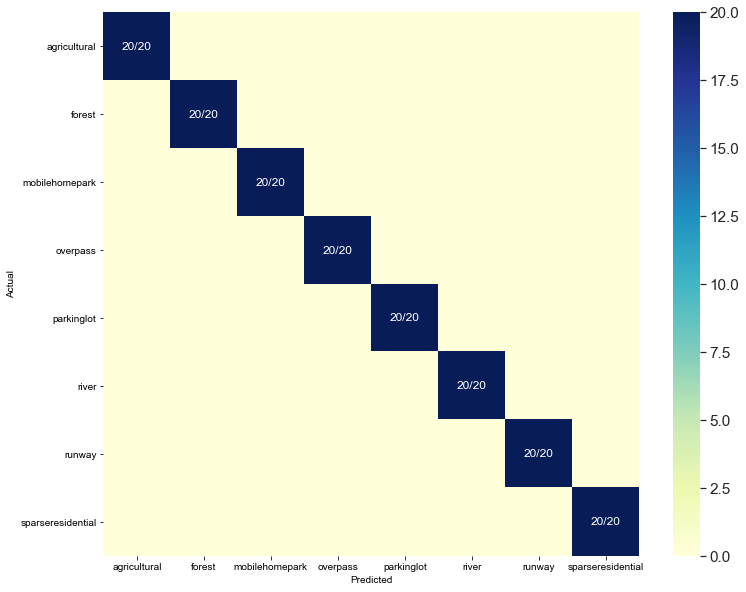

In [24]:
plot_cm( y_test.argmax(axis=1), predictions.argmax(axis=1))

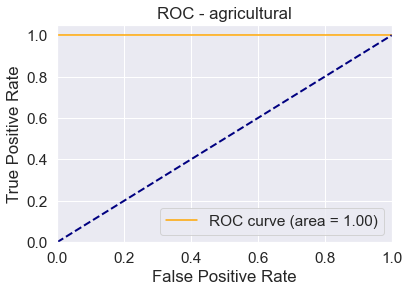

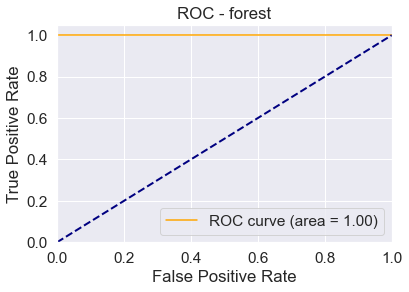

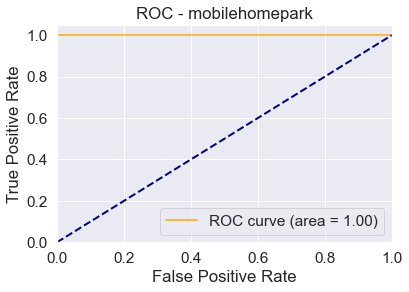

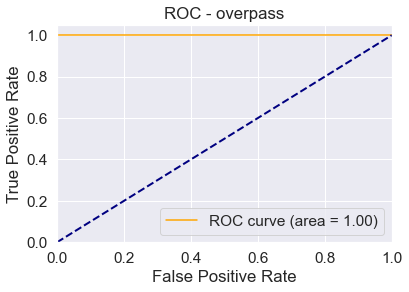

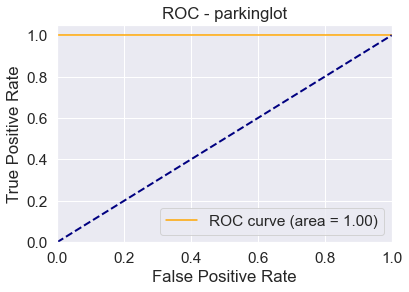

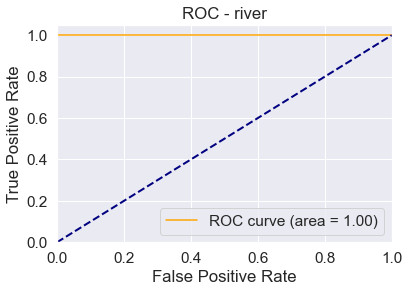

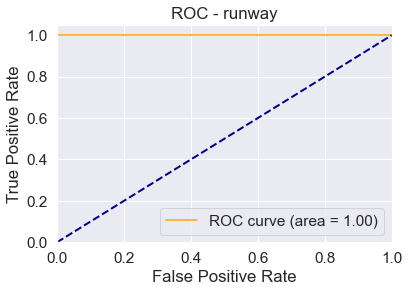

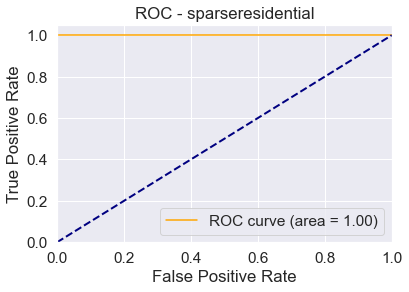

In [25]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

y_score = model.predict(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(nb_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(nb_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], color='orange', label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC - '+ category_names[i])
    plt.legend(loc="lower right")
    plt.show()

In [26]:
# VISUALIZE IMAGES

import math

def plotImages_categories( images, labels, predictions, n_cols=4, figsize=(10, 10)):
    fig, axes = plt.subplots(math.ceil(len(images)/n_cols), n_cols, figsize=figsize)
    axes = axes.flatten()
    for i in range(math.ceil(len(images)/n_cols) * n_cols):
        axes[i].set_xticks(())
        axes[i].set_yticks(())
        
        if i < len(images):
            axes[i].imshow(images[i])
            if predictions is not None:
                title = 'LABEL:{}\nPRED: {}'.format(labels[i], predictions[i])

                if predictions[i] != labels[i]:
                    [j.set_linewidth(5) for j in axes[i].spines.values()]
                    [j.set_color('red') for j in axes[i].spines.values()]

            else:
                title = 'LABEL:{}'.format(labels[i])
            axes[i].set_title(title, fontdict={'family':'monospace'}, loc='left',fontsize = 12)
    plt.tight_layout()
    plt.show()


Category:agricultural, Total Samples:20


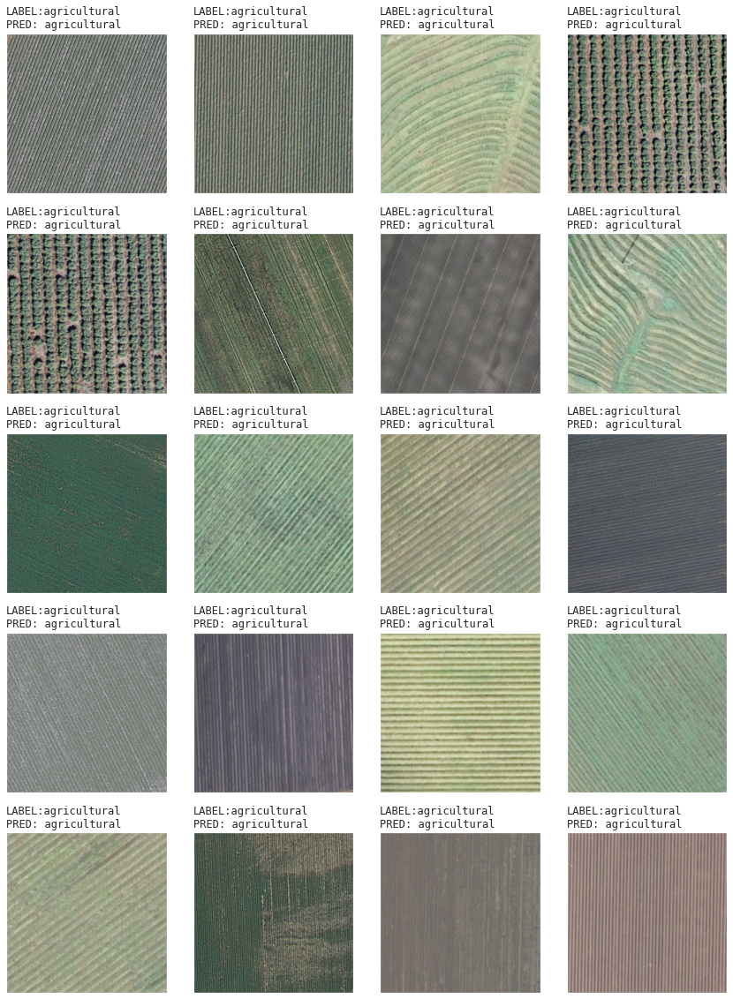


Category:forest, Total Samples:20


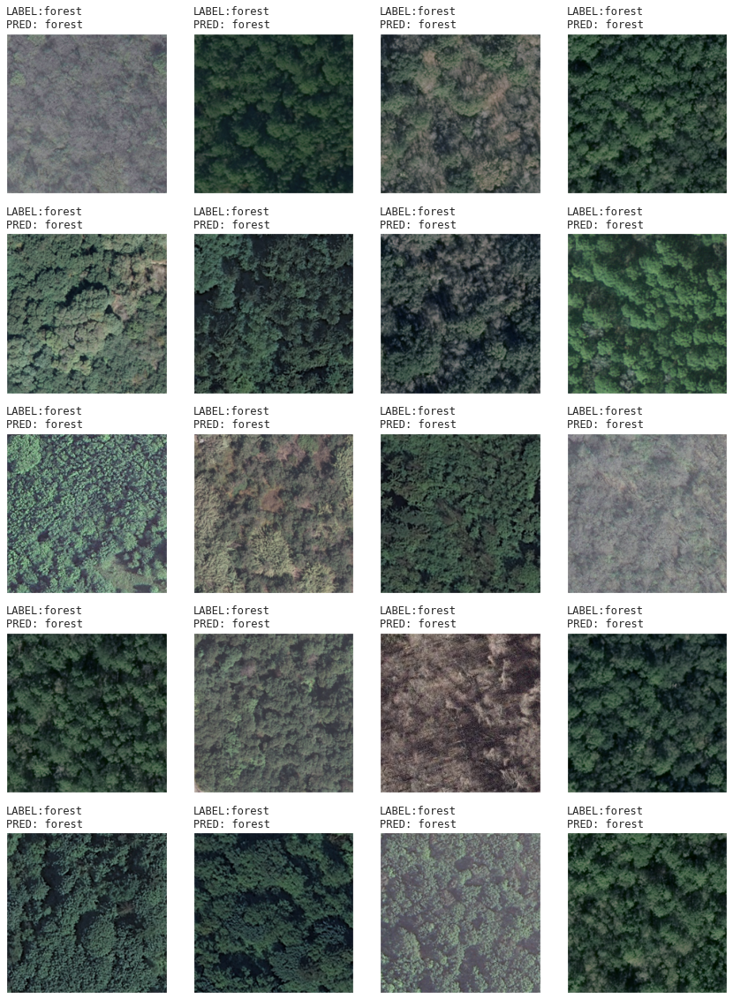


Category:mobilehomepark, Total Samples:20


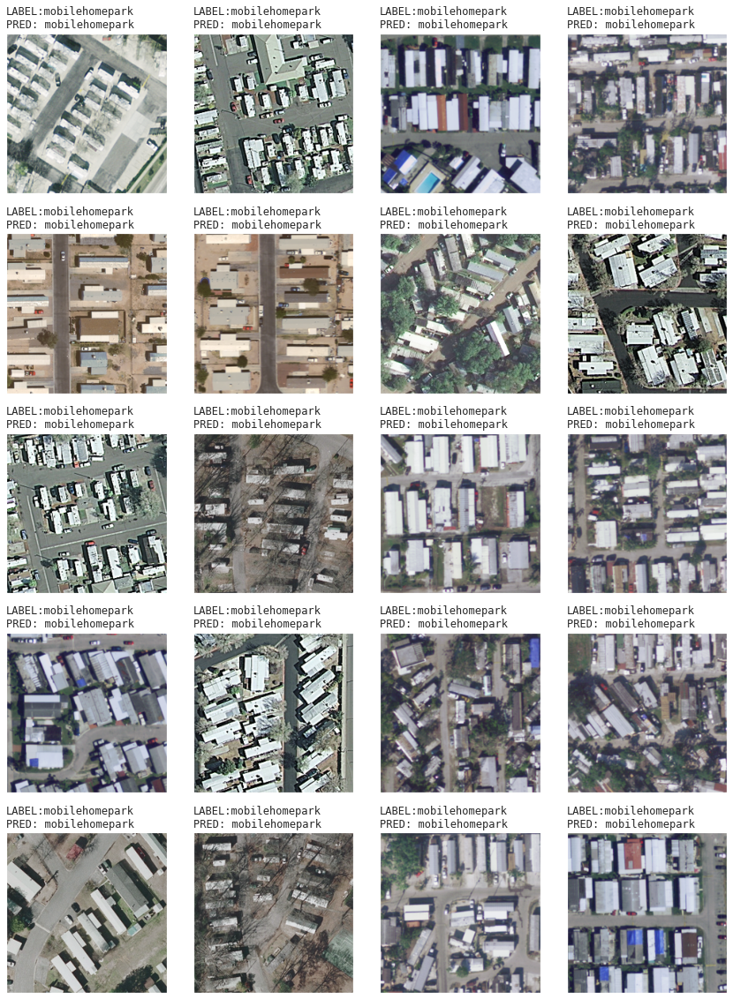


Category:overpass, Total Samples:20


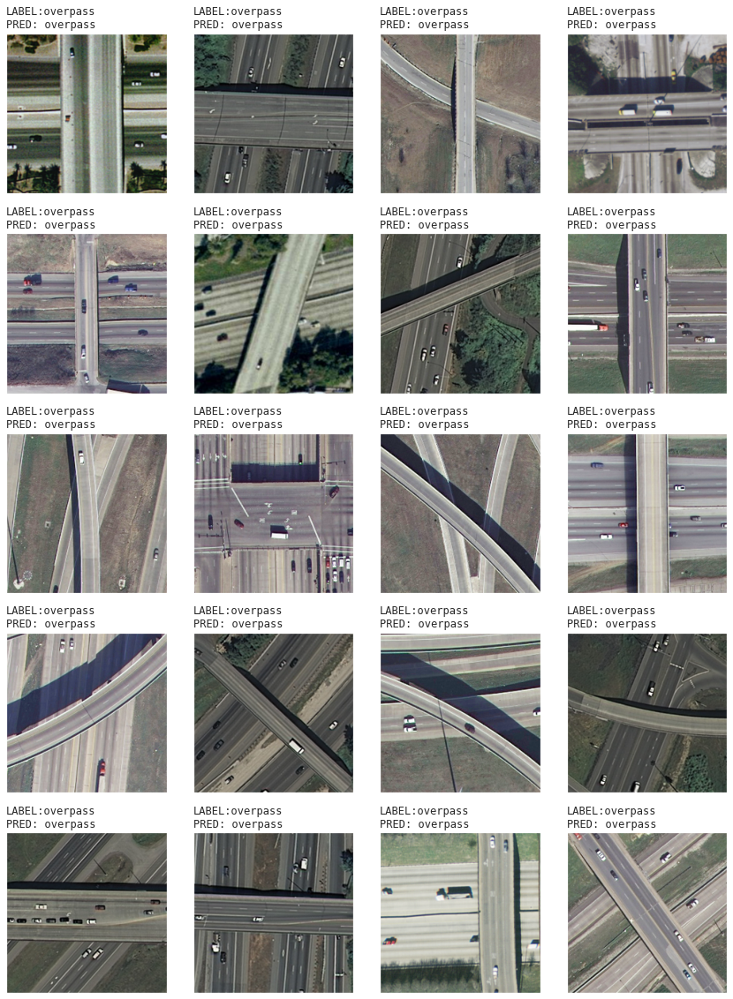


Category:parkinglot, Total Samples:20


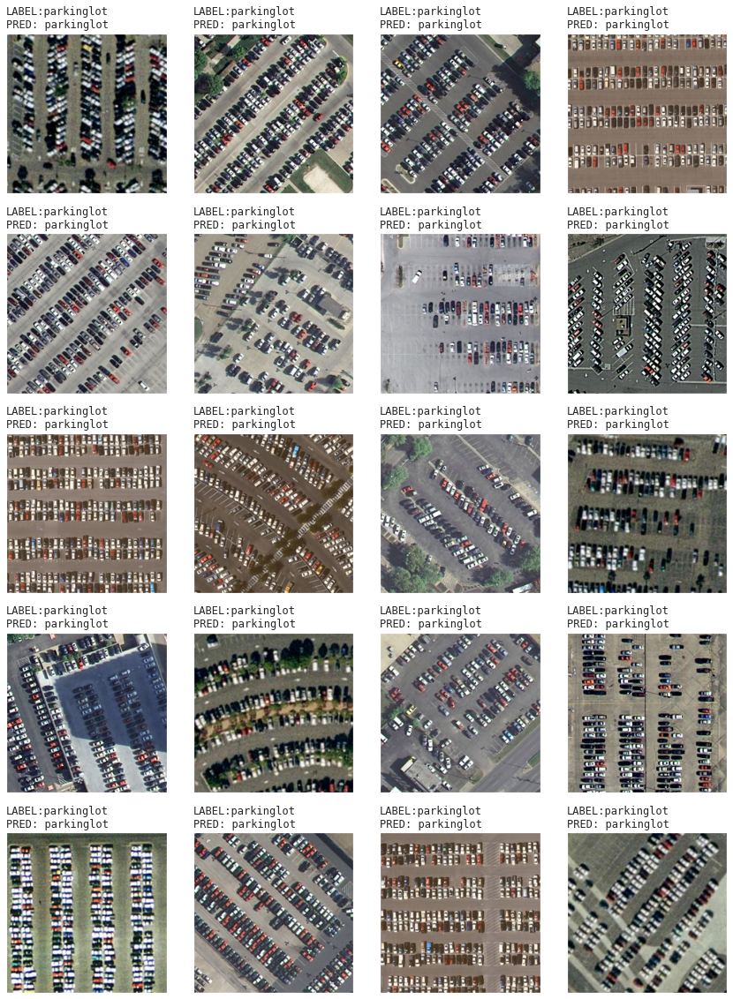


Category:river, Total Samples:20


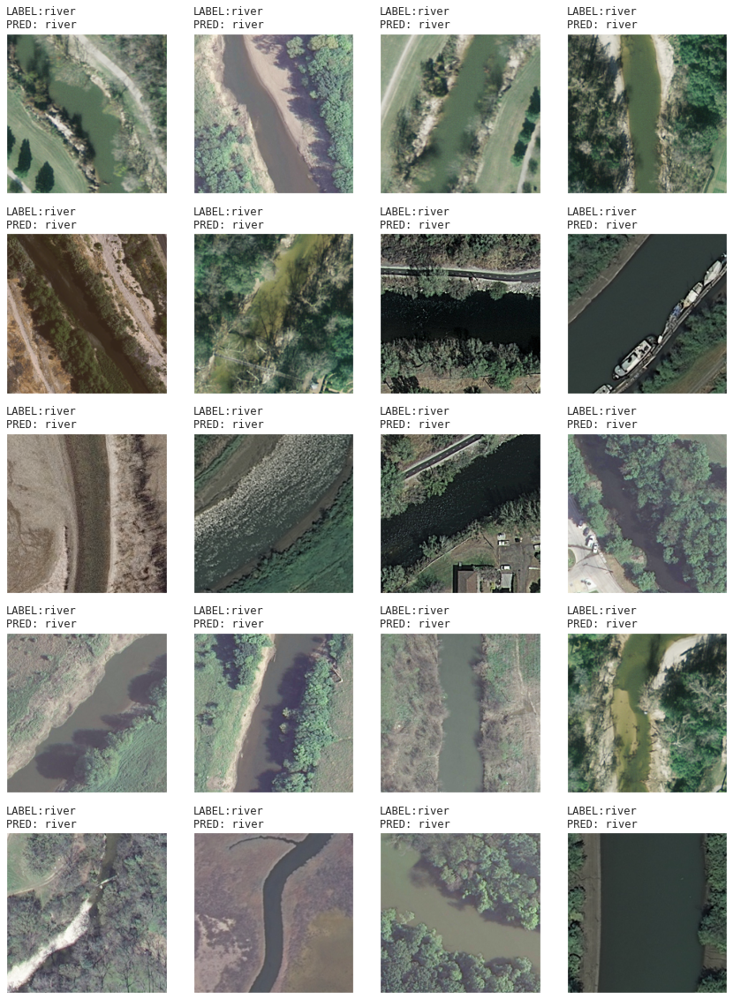


Category:runway, Total Samples:20


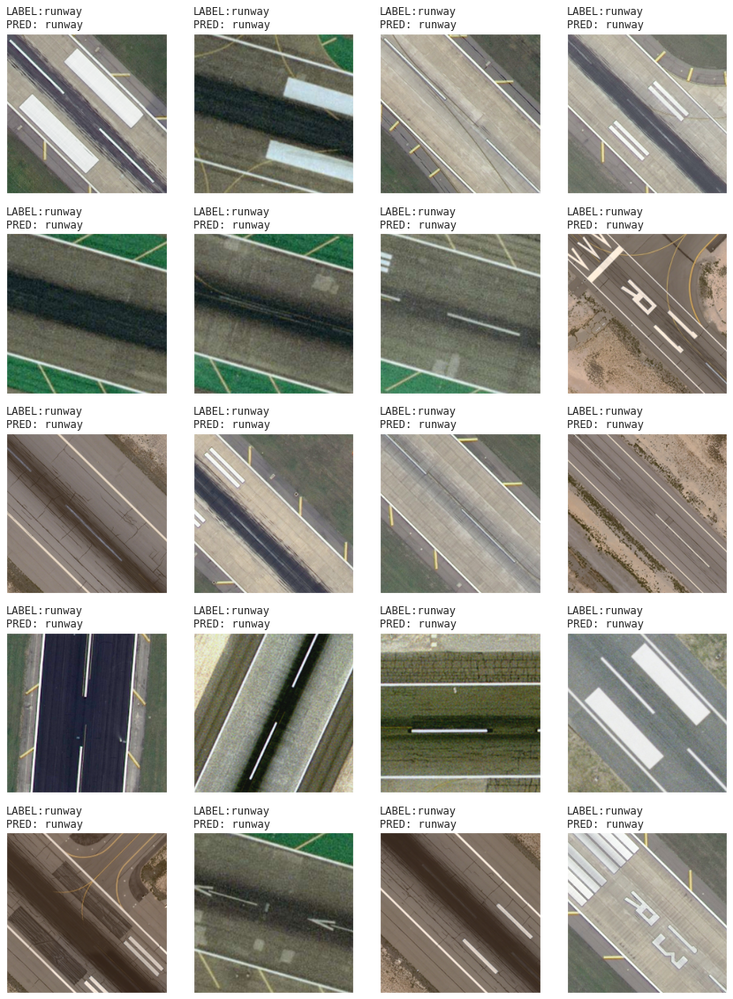


Category:sparseresidential, Total Samples:20


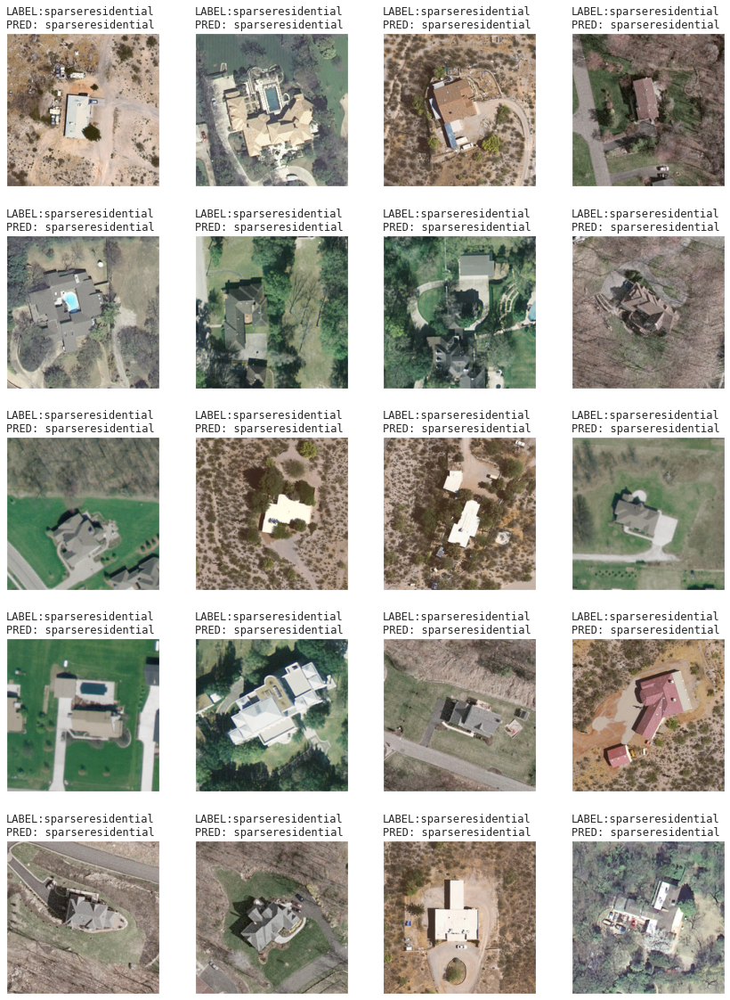

In [27]:
for i in range(len(category_names)):
    cat = []
    cat_pred = []
    X_test_cat = []
    for j in range(len(y_test)):
        if y_test.argmax(axis=1)[j] == i:
            cat.append(category_names[i])
            cat_pred.append(category_names[predictions.argmax(axis=1)[j]])
            X_test_cat.append(X_test[j])
    
    print('\nCategory:{}, Total Samples:{}'.format(category_names[i], len(cat)))
    
    plotImages_categories(images=X_test_cat, labels=cat,
                          predictions=cat_pred, 
                        figsize=(12, 16))